In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from scipy import stats
from tqdm.auto import tqdm
from pylab import rcParams

In [2]:
# Эта команда позволяет вывыводить результаты друг за другом без вызова print
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Задание

* Попробовать найти и показать различные инсайты в этом датасете с помощью графиков Seaborn, Matplotlib и Plotly
* Дополнить графики комментариями

# Информация о доходах и тратах пользователей 

| Поле | Расшифровка | 
| --- | --- |
| age | возраст | 
| gender | пол repexc_date |
| city_type	| Тип города проживания клиента |
| full_mob |Длительность взаимоотношений с банком |
| ml_balance |ипотека |
| cl_balance_0m	| потребительский кредит |
| loan_balance_0m |все кредиты |
| td_balance_0m	| депозит |
| casa_balance_0m |счета |
| dc_trx_cnt |количество трат по картам |
| dc_trx_sum | сумма трат по картам |
| Avg_trx | средний размер транзакции |
| avgtrx_to_balance | |
| min_casa_balance_1q |показатели по счетам за квартал |
| max_casa_balance_1q | |
| avg_casa_balance_1Y |показатели по счетам за год |
| min_td_balance_1q | |
| max_td_balance_1q | |
| avg_td_balance_1Y | |
| min_loan_balance_1q | |
| max_loan_balance_1q | |
| avg_loan_balance_1Y | |
| min_cl_balance_1q	| |
| max_cl_balance_1q	| |
| avg_cl_balance_1Y	| |
| loan_to_deposit | |
| income | доход клиента |
| nbi | доход от клиента без OPEX |

In [3]:
df = pd.read_csv('test_cluster.csv', encoding='cp1251', sep=';')
df.head()

,age,gender,city_type,full_mob,ml_balance,cl_balance_0m,loan_balance_0m,td_balance_0m,casa_balance_0m,dc_trx_cnt,...,min_loan_balance_1q,max_loan_balance_1q,avg_loan_balance_1Y,min_cl_balance_1q,max_cl_balance_1q,avg_cl_balance_1Y,loan_to_deposit,Avg_trx,avgtrx_to_balance,nbi
0,71,NaN,<100,103,0.0,0.0,0.0,0.0,0.0000,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,49,NaN,Mega,81,0.0,0.0,0.0,0.0,3272.9367,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,28.762952
2,56,NaN,Mega,81,0.0,0.0,0.0,0.0,6249.7550,6,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,854.67,0.083467,1973.335539
3,47,NaN,Mega,81,0.0,0.0,0.0,0.0,14354.9370,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,364.008556
4,74,NaN,Mega,81,0.0,0.0,0.0,0.0,91511.7691,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,6651.416562


# Подозрительные пользователи

* Найдем пользователей, которые тратят денег больше, чем им позволяет личный доход

30839

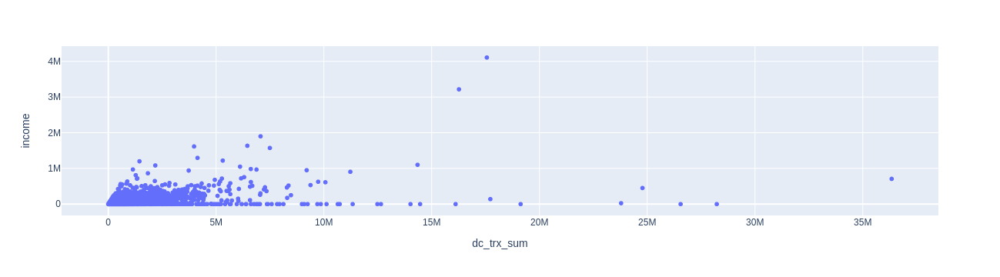

In [4]:
df_suspect = df[df.dc_trx_sum != 0] # Исключаем пользователей у которых нет трат
df_suspect = df_suspect[df_suspect.dc_trx_sum > df_suspect.income] # Исключаем пользователей у которых траты меньше дохода
len(df_suspect)
fig = px.scatter(df_suspect, x="dc_trx_sum", y="income")
fig.show()

* Найдем пользователей, которые тратят денег больше, чем у них есть на депозите + личных счетах + кредитных счетах

26290

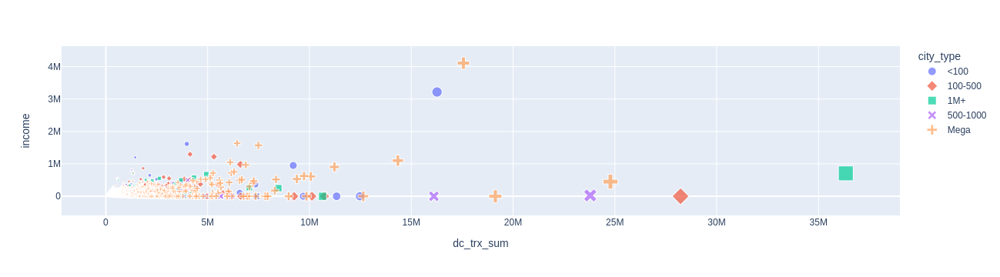

In [5]:
df_suspect = df_suspect[((df_suspect.casa_balance_0m + df_suspect.td_balance_0m + df_suspect.loan_balance_0m) - df_suspect.dc_trx_sum) < 0 ] # Исключаем пользователей, 
#у которых была достаточная заначка на счетах(личных и кредитных)
len(df_suspect)
fig = px.scatter(df_suspect, x="dc_trx_sum", y="income", color="city_type", size='dc_trx_sum', hover_data=['casa_balance_0m','td_balance_0m','loan_balance_0m'], symbol="city_type")
fig.show()

* 26290 пользователей расходуют средств больше чем располагают на личных и кредитных счетах банка, 
* требуется дополнительный анализ со стороны Отдела Безопасности для обнаружения не задокументированных источников доходов пользователя :) 

# Ипотека пользователей

* 574 пользователя, у кого есть долг по Ипотеке - из них 108 имеют стабильный доход
* С учетом пола пользователя и выхода на пенсию (после чего происходит падение доходов как мы заметим по графику далее),
* Считая что все пользователи будут стабильно отдавать 50% дохода ежемесячно на погащение ипотеки,
* 8 пользователей не успеют или не успели выплатить ипотеку до момента выхода на пенсию с учетом текущих данных,
* требуется поставить данных пользователей на вспомогательный контроль.

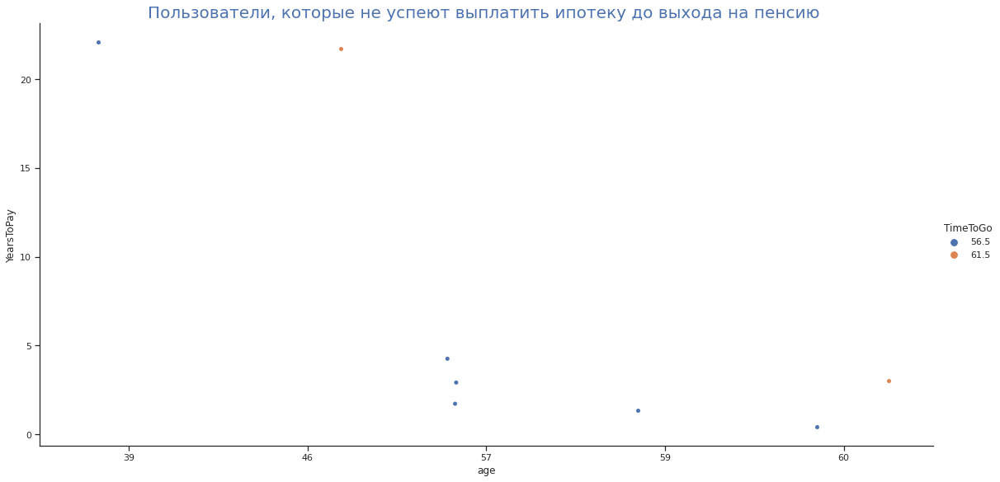

In [6]:
df_ml = df[df.ml_balance > 0] # Найдем пользователей, у кого есть долг по Ипотеке
df_ml = df_ml[df_ml.income > 0] # Найдем пользователей, у кого есть стабильный доход
df_ml.loc[:,'YearsToPay'] = df_ml.apply(lambda x: x['ml_balance']/(x['income']/2)/12 if x['income'] != 0 else np.inf, axis=1) # Подсчитаем количество лет, 
#которое потребуется при текущем доходе чтобы рассчитаться с Ипотекой (с учетом что из дохода пользвоатель будет отдавать 50% процентов на погащение)

conditions = [ # Условия выхода на пенсию в РФ
    (df_ml['gender'] == 'М'),
    (df_ml['gender'] == 'F'),
    (df_ml['gender'] == 'nan')]
choices = [61.5, 56.5, 56.5]
df_ml['TimeToGo'] = np.select(conditions, choices, default=56.5) # для пользователей с неизвестным полом берем наихудший для нас вариант, наименьший возраст

df_ml = df_ml[(df_ml.age + df_ml.YearsToPay) > df_ml.TimeToGo]
#df_ml[["ml_balance","td_balance_0m","income","casa_balance_0m","age","YearsToPay","TimeToGo"]]

sns.set(style="ticks", color_codes=True)

sns.catplot(
    x='age',
    y='YearsToPay', 
    data=df_ml, 
    hue='TimeToGo',   
    jitter=0.1,
    height=8, 
    aspect=2, 
    kind='strip', 
    dodge=True) 
plt.title('Пользователи, которые не успеют выплатить ипотеку до выхода на пенсию ', size=20, color='b');

# Возраст-Доход пользователей

* Согласно зависимости между возрастом и доходом пользователей,
* 2116 пользователей (лишь 4%) преодолели границу дохода в 100к единиц, требуется ориентироваться на основной массив пользователей с меньшим доходом
* Средний возраст достижений дохода для данных пользователей составил 42 года

* Исключая пользователей с доходом более 100к единиц,
* Наблюдается стабильный рост дохода с 20 до 65 лет, после чего происходит падение доходов.
* После 65 лет требуется корректировка предложений банка с учетом падения доходов пользователя.

In [7]:
len(df[df.income > 100000]) # Количество пользователей, преодолевшие границу дохода в 100к единиц
(len(df[df.income > 100000])/len(df)) * 100 # Процент пользователей, преодолевшие границу дохода в 100к единиц
df[df.income > 100000].age.mean() # Средний возраст более успешных пользователей

2116

4.232

42.492911153119096

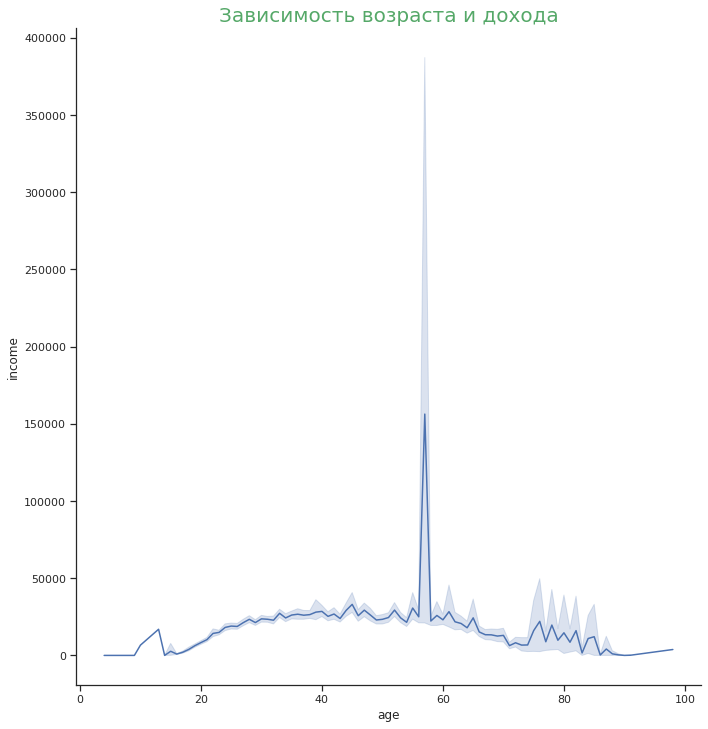

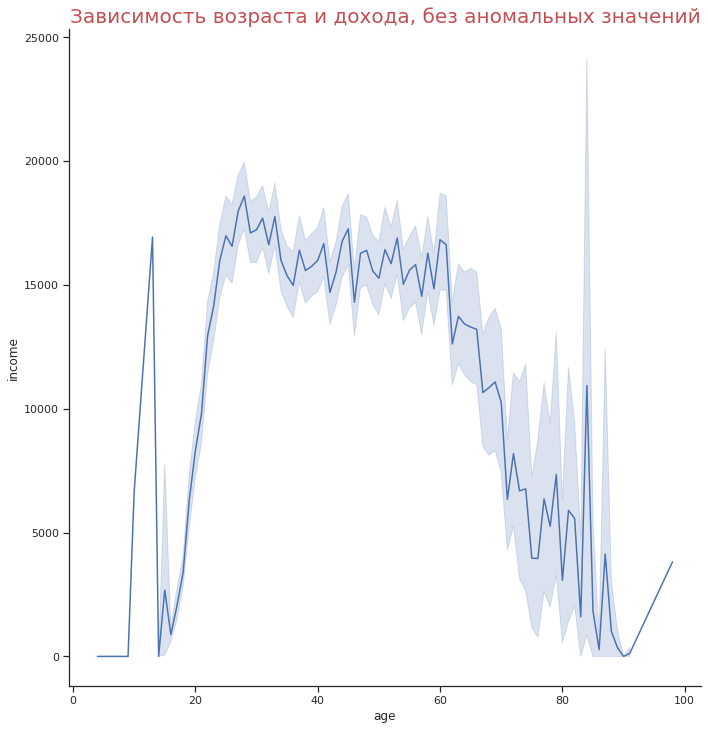

In [8]:
sns.relplot(
    x='age', 
    y='income',  
    data=df, 
    kind='line',
    height=10)
plt.title('Зависимость возраста и дохода', size=20, color='g');

sns.relplot(
    x='age', 
    y='income', 
    data=df[df.income < 100000], 
    kind='line',
    height=10)
plt.title('Зависимость возраста и дохода, без аномальных значений', size=20, color='r');